In [1]:
# Make coverage plot and get total survey area
# Also includes plots for comparison with CARMA

In [2]:
from astropy.io import fits
import numpy as np
#import numpy.ma as ma
import matplotlib.pyplot as plt
import aplpy
#from math import *
from astropy import units as u

/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/core.py:14: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid module was deprecated in Matplotlib 2.1 and will be removed two minor releases later. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist, which provide the same functionality instead.
  import mpl_toolkits.axes_grid.parasite_axes as mpltk


In [3]:
#Path to write
path3='/Users/battersby/Dropbox/Work/cmz/cmzoom_overview/overleaf_cmzoom/10383815hfwsykpqhnrx/figures/'

#Path to Herschel Data
path='/Users/battersby/Dropbox/Work/cmz/herschel/'
hdulist1=fits.open(path+'column_properunits_conv36_source_only.fits')
hdu1=hdulist1[0]
herschel=hdulist1[0].data
#herschel=dat1.flatten()

#Path to CMZoom data
path2='/Users/battersby/Dropbox/CMZoom_Data/continuum_images/Final_continuum_images/Mosaics/Actual_Final/'
#hdulist2=fits.open(path2+'Continuum_mosaic_current.fits')
hdulist2=fits.open(path2+'CMZoom_continuum_pbcor.fits')
cmzoom=hdulist2[0].data
hdr=hdulist2[0].header
#cmzoom=dat2.flatten()


In [4]:
def nan_mask(filename,outfile):
    fh = fits.open(filename)
    fh[0].data[np.isfinite(fh[0].data)]=1
    fh[0].data = np.nan_to_num(fh[0].data)
    fh.writeto(outfile, overwrite=True)
    
#nan_mask(path2+'Continuum_mosaic_current.fits', path+'CMZoom_Mask_v1.fits')
nan_mask(path2+'CMZoom_continuum_pbcor.fits', path2+'CMZoom_mosaic_Mask.fits')

In [5]:
### Calculate total survey area:
wsurvey = cmzoom[~np.isnan(cmzoom)]
lsurvey = wsurvey.size
area_survey = lsurvey*np.abs(hdr['CDELT1'])*np.abs(hdr['CDELT2'])*60*60 #square arcminutes
print(area_survey, 'Square Arcminutes')

349.1334721775332 Square Arcminutes


In [6]:
### assuming distance = 8.15 kpc
gcdist=8150 #pc Reid et al. (2019)
area_survey_sqas = area_survey*(60.)*(60.)
area_survey_sqpc = (area_survey_sqas/(206265*206265))*gcdist*gcdist
survey_oneside_pc = np.sqrt(area_survey_sqpc)
print(area_survey_sqpc, 'Square pc', survey_oneside_pc, 'pc')

1962.2671052362796 Square pc 44.297484186308814 pc


In [7]:
## Figure out the total mass from Herschel of pixels covered by CMZoom

print(herschel.shape)
print(cmzoom.shape)


(834, 2226)
(2800, 19000)


<IPython.core.display.Javascript object>


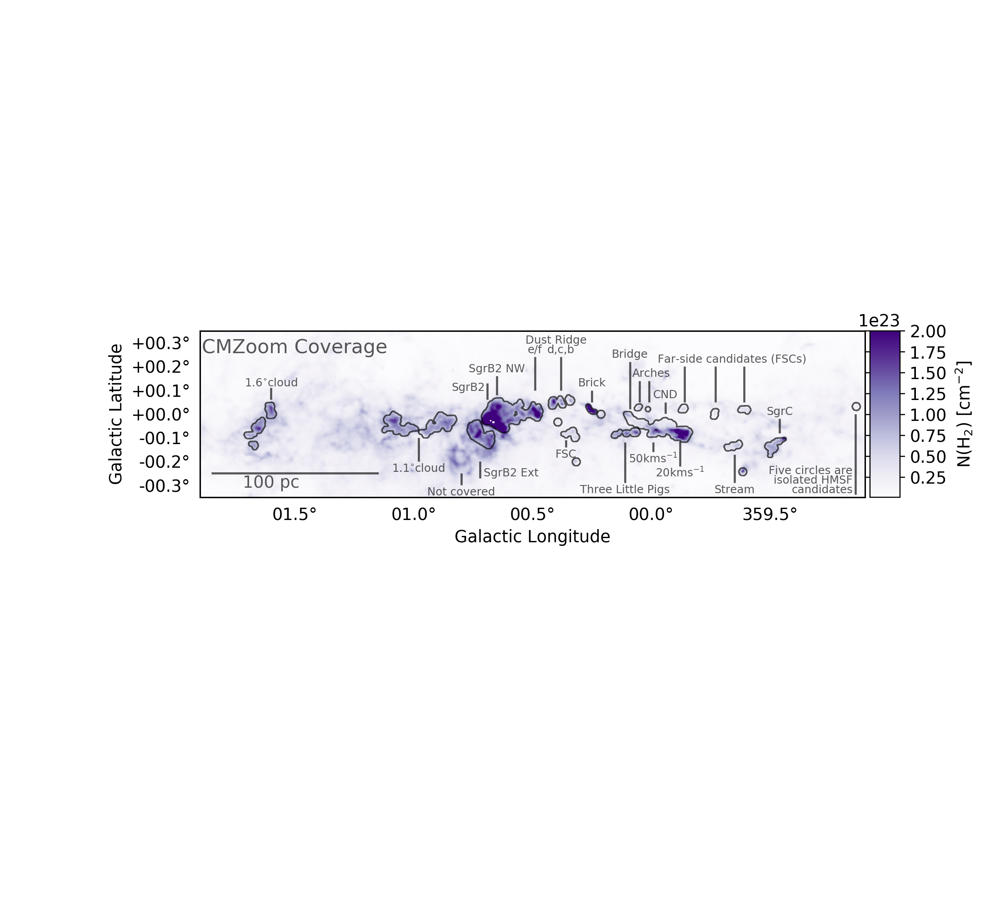

/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/wcs_util.py:515: UserWarning: Pixels are not square, using an average pixel scale
  warnings.warn("Pixels are not square, using an average pixel scale")
/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/normalize.py:164: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cbook.iterable(value):
/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/colorbar.py:138: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  tick.tick1On = True
/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/colorbar.py:139: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick2line.set_visible instead.
  tick.tick2On = True
/Users/battersby/anaconda3/lib/pyt

In [37]:
# Plot overall coverage
# with labels is obscenely complex! There must be a better way...?
%matplotlib nbagg

#Set to 1 if you want to create the coverage file with cloud labels, 0 if you want the one without
# why so complex?!
with_labels = 1

plt.rcParams.update({'font.size': 12}) #set fontsize

fig=aplpy.FITSFigure(path+'column_properunits_conv36_source_only.fits')
#fig=aplpy.FITSFigure(path2+'Continuum_mosaic.fits', convention='wells')
fig.recenter(0.5,0.0, width=2.8, height=0.7)
fig.show_colorscale(cmap='Purples', vmin=0.1e+22,vmax=2e+23)
fig.add_colorbar()
fig.colorbar.set_width(0.3)
fig.colorbar.set_axis_label_text('N(H$_2$) [cm$^{-2}$]')

#fig.set_theme('publication')
fig.set_tick_labels_format(xformat='dd.d', yformat='dd.d')
#hmmmm, won't let me set yformat='d.d' :(

#BROKE!! 
#fig.add_scalebar(0.674*u.degree, color='black',alpha=0.65)#, fontsize=6)
#fig.scalebar.set_corner('top left') # This command broke since last use, no simple solution as of Feb. 27, 2020
#fig.scalebar.set_label('100 pc')#, fontsize=14)

# INSTEAD DO A LINE AND LABEL
gcdist = 8.15e3 #pc
dgper1pc = (1.0/gcdist)*(360.0/(2.0*np.pi))
dgper100pc = dgper1pc*100.0
scalebar100pc = np.array([[1.85,(1.85-dgper100pc)],[-0.25,-0.25]]) #previous placement of scale bar and label
fig.show_lines([scalebar100pc], color='black', alpha=0.65)
fig.add_label(1.6, -0.29, '100 pc', color='black', alpha=0.65)
#scalebar100pc = np.array([[1.8,(1.8-dgper100pc)],[0.12,0.12]]) #previous placement of scale bar and label
#fig.show_lines([scalebar100pc], color='black', alpha=0.65)
#fig.add_label(1.5, 0.16, '100 pc', color='black', alpha=0.65)
#scalebar100pc = np.array([[1.7,(1.7-dgper100pc)],[0.25,0.25]]) #previous placement of scale bar and label
#fig.add_label(1.4, 0.29, '100 pc', color='black', alpha=0.65)


fig.show_contour(path2+'CMZoom_mosaic_Mask.fits',linewidths=1,colors='black', alpha=0.65, levels=[0], convention='wells')
plt.gcf().subplots_adjust(bottom=0.2) # make room for x-axis
plt.gcf().subplots_adjust(left=0.2) # make room for y-axis

if with_labels==0:
    fig.add_label(-0.5,0.28, 'CMZoom Coverage', color='black',alpha=0.65, fontsize=10)
    plt.savefig(path3+'CMZoom_coverage.pdf', format='pdf', dpi=500, bbox_inches='tight')
    # need to save as PDF otherwise lose transparency
else:
    plt.rcParams.update({'font.size': 8}) #set fontsize
    color='black'
    alpha=0.65
    fig.add_label(1.5,0.28, 'CMZoom Coverage', color='black',alpha=0.65, fontsize=14)
#    cloud16 = np.array([[1.65,1.65],[-0.22,-0.17]])
    cloud16 = np.array([[1.6,1.6],[0.06,0.11]])
    cloud11 = np.array([[0.98,0.98],[-0.2,-0.1]])
    missing = np.array([[0.8,0.8],[-0.30,-0.25]])
    sgrb2ext = np.array([[0.72,0.72],[-0.27,-0.20]])
    sgrb2 = np.array([[0.69,0.69],[0.13,0.06]])
    sgrb2nw = np.array([[0.65,0.65],[0.16,0.08]])
    #dref = np.array([[0.49,0.49],[-0.1,-0.04]])
    dref = np.array([[0.49,0.49],[0.24,0.1]])
    drdcb = np.array([[0.38,0.38],[0.24, 0.1]])
    far0 = np.array([[0.36,0.36],[-0.14,-0.11]])
    brick = np.array([[0.25,0.25],[0.1,0.05]])
    tlp = np.array([[0.11,0.11],[-0.29, -0.12]])
    fifty = np.array([[-0.008,-0.008],[-0.16,-0.12]])
    twenty = np.array([[359.88,359.88],[-0.22,-0.115]])
    cnd = np.array([[359.94,359.94],[0.05,0.001]])
    bridge = np.array([[0.09,0.09],[0.22,0.02]])
    arches = np.array([[0.01,0.01],[0.14,0.05]])
    arches2 = np.array([[0.05,0.05],[0.14,0.05]])
    far1 = np.array([[359.86,359.86],[0.2,0.05]])
    far2 = np.array([[359.73,359.73],[0.2,0.05]])
    far3 = np.array([[359.61,359.61],[0.2,0.05]])
    sgrc = np.array([[359.46,359.46],[-0.02,-0.08]])
    stream = np.array([[359.65,359.65],[-0.29,-0.17]])
    isolated = np.array([[359.14,359.14],[-0.34,0.0]])
    line_list=[cloud16,cloud11,missing,sgrb2ext,sgrb2,sgrb2nw,dref,drdcb,far0,brick,tlp,
               fifty,twenty,cnd,bridge,arches,arches2,far1,far2,far3,sgrc,stream,isolated]
    fig.show_lines(line_list, color='black',alpha=0.65)
    #fig.add_label(cloud16[0,0],cloud16[1,0]-0.03, '1.6$^{\circ}$cloud', color=color,alpha=alpha)
    fig.add_label(cloud16[0,0],cloud16[1,0]+0.07, '1.6$^{\circ}$cloud', color=color,alpha=alpha)
    fig.add_label(cloud11[0,0],cloud11[1,0]-0.03, '1.1$^{\circ}$cloud', color=color,alpha=alpha)
    fig.add_label(missing[0,0],missing[1,0]-0.03, 'Not covered', color=color,alpha=alpha)
    fig.add_label(sgrb2ext[0,0]-0.13,sgrb2ext[1,0]+0.02, 'SgrB2 Ext', color=color,alpha=alpha)
    fig.add_label(sgrb2[0,0]+0.08,sgrb2[1,0]-0.02, 'SgrB2', color=color,alpha=alpha)
    fig.add_label(sgrb2nw[0,0],sgrb2nw[1,0]+0.03, 'SgrB2 NW', color=color,alpha=alpha)
    #fig.add_label(dref[0,0],dref[1,0]-0.05, 'Dust Ridge e/f', color=color,alpha=alpha)
    fig.add_label(drdcb[0,0]+0.02,drdcb[1,0]+0.07, 'Dust Ridge', color=color,alpha=alpha)
    fig.add_label(dref[0,0],dref[1,0]+0.03, 'e/f', color=color,alpha=alpha)
    fig.add_label(drdcb[0,0],drdcb[1,0]+0.03, 'd,c,b', color=color,alpha=alpha)
    fig.add_label(far0[0,0],far0[1,0]-0.03, 'FSC', color=color,alpha=alpha)
    #fig.add_label(far0[0,0]+0.04,far0[1,0]-0.05, 'candidate', color=color,alpha=alpha)
    fig.add_label(brick[0,0],brick[1,0]+0.03, 'Brick', color=color,alpha=alpha)
    fig.add_label(tlp[0,0],tlp[1,0]-0.03, 'Three Little Pigs', color=color,alpha=alpha)
    fig.add_label(fifty[0,0],fifty[1,0]-0.03, '50kms$^{-1}$', color=color,alpha=alpha)
    fig.add_label(twenty[0,0],twenty[1,0]-0.03, '20kms$^{-1}$', color=color,alpha=alpha)
    fig.add_label(cnd[0,0],cnd[1,0]+0.03, 'CND', color=color,alpha=alpha)
    fig.add_label(bridge[0,0],bridge[1,0]+0.03, 'Bridge', color=color,alpha=alpha) #H$_2$CO 
    fig.add_label(arches[0,0]-0.01,arches[1,0]+0.03, 'Arches', color=color,alpha=alpha) 
    fig.add_label(far2[0,0]-0.07,far2[1,0]+0.03, 'Far-side candidates (FSCs)', color=color,alpha=alpha) 
    fig.add_label(sgrc[0,0],sgrc[1,0]+0.03, 'SgrC', color=color,alpha=alpha) 
    fig.add_label(stream[0,0],stream[1,0]-0.03, 'Stream', color=color,alpha=alpha) 
    fig.add_label(isolated[0,0]+0.19,isolated[1,0]+0.1, 'Five circles are', color=color,alpha=alpha) 
    fig.add_label(isolated[0,0]+0.18,isolated[1,0]+0.06, 'isolated HMSF', color=color,alpha=alpha) 
    fig.add_label(isolated[0,0]+0.14,isolated[1,0]+0.02, 'candidates', color=color,alpha=alpha) 

    plt.savefig(path3+'CMZoom_coverage_cloud_labels.pdf', format='pdf', dpi=500, bbox_inches='tight')

plt.show()



In [ ]:
### Plotting comparison with CARMA data

In [9]:
#Path to CARMA data
pathcarma='/Users/battersby/Dropbox/CMZoom_Data/Comparison_Data/carma_cmz/'
hdulist3=fits.open(pathcarma+'gc_carma15+8_continuum.fits')
carma=hdulist3[0].data
carmahdr=hdulist3[0].header

In [12]:
print(path)
pathmosaic='/Users/battersby/Dropbox/CMZoom_Data/dense_gas_fraction/CMZoom_Mask_new_NaNs.fits'


/Users/battersby/Dropbox/Work/cmz/herschel/


INFO: Setting slices=[0, 0] [aplpy.core]


<IPython.core.display.Javascript object>


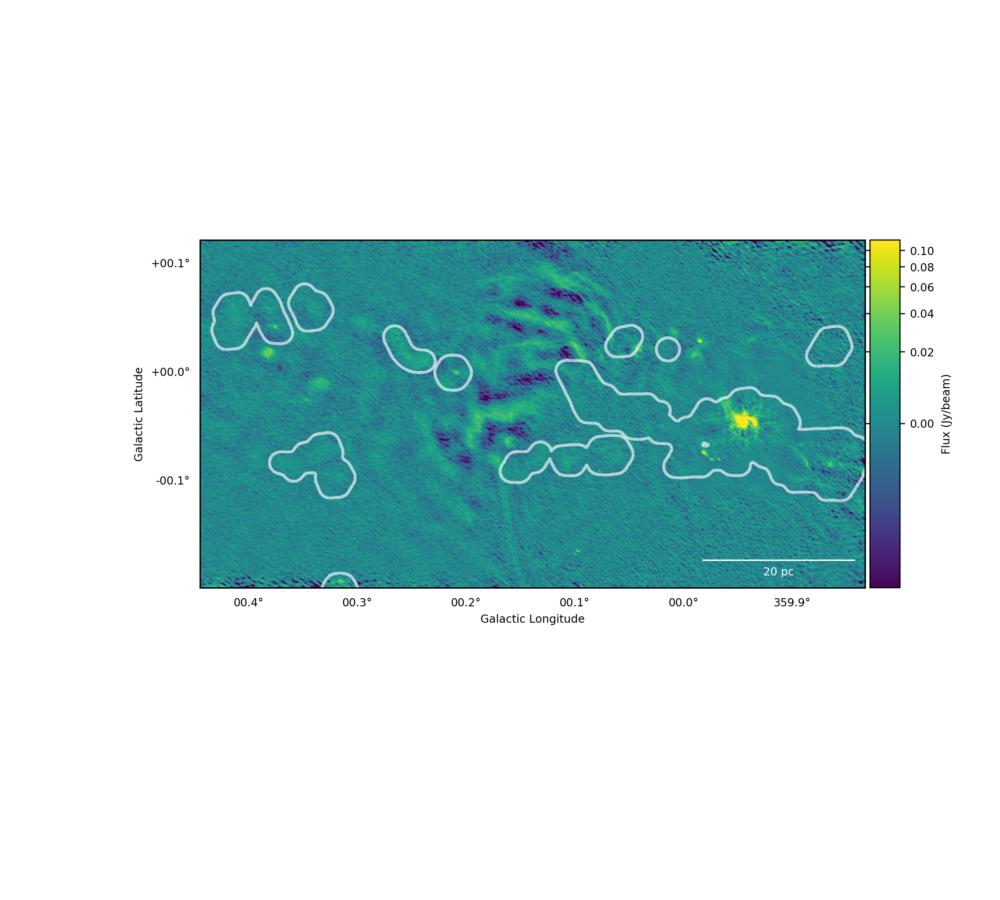

INFO: Auto-setting vmin to -1.468e-02 [aplpy.core]
INFO: Auto-setting vmax to  1.151e-01 [aplpy.core]


/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/normalize.py:164: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cbook.iterable(value):
/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/colorbar.py:138: MatplotlibDeprecationWarning: 
The tick1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick1line.set_visible instead.
  tick.tick1On = True
/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/colorbar.py:139: MatplotlibDeprecationWarning: 
The tick2On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.tick2line.set_visible instead.
  tick.tick2On = True
/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/colorbar.py:140: MatplotlibDeprecationWarning: 
The label1On function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use Tick.label1.set_visible instead.
  tick.label1On = F

In [20]:
%matplotlib nbagg

fig=aplpy.FITSFigure(pathcarma+'gc_carma15+8_continuum.fits')
fig.show_colorscale(cmap='viridis', pmin=0.25, pmax=99.95, stretch='arcsinh')
fig.show_colorbar()
fig.colorbar.set_width(0.3)
fig.colorbar.set_axis_label_text('Flux (Jy/beam)')

fig.set_tick_labels_format(xformat='ddd.d', yformat='dd.d')

fig.show_contour(path+'CMZoom_mosaic_Mask.fits',linewidths=2,colors='white', alpha=0.65, levels=[0], convention='wells')
#fig.show_contour('/Users/battersby/Dropbox/CMZoom_Data/dense_gas_fraction/CMZoom_Mask_new_NaNs.fits',
#                 linewidths=2,colors='white', alpha=0.65, levels=[1.0], convention='wells')
plt.gcf().subplots_adjust(bottom=0.2) # make room for x-axis
plt.gcf().subplots_adjust(left=0.2) # make room for y-axis

#fig.add_label(-0.3,0.25, 'CMZoom Coverage', color='black',alpha=0.65, fontsize=10)
#fig.add_label(-0.5,0.25, 'CMZoom Coverage', color='black',alpha=0.65, fontsize=10)


#Add scalebar of 3 pc. First calculate the size in degrees of 1 pc
gcdist=8150 #pc Reid et al. (2019)
degper1pc=(1.0/gcdist)*(360.0/(2.0*np.pi))
fig.add_scalebar(20.0*degper1pc*u.degree)
#fig.scalebar.set_corner('bottom right')
fig.scalebar.set_label('20 pc')
fig.scalebar.set_color('white')

#legend = plt.legend(loc='upper right', shadow=False, fontsize=24)#'x-large')
plt.savefig(path3+'CARMA_comparison.pdf',
            format='pdf', dpi=1000, bbox_inches='tight')
# need to save as PDF otherwise lose transparency

plt.show()





INFO: Setting slices=[0, 0] [aplpy.core]


<IPython.core.display.Javascript object>


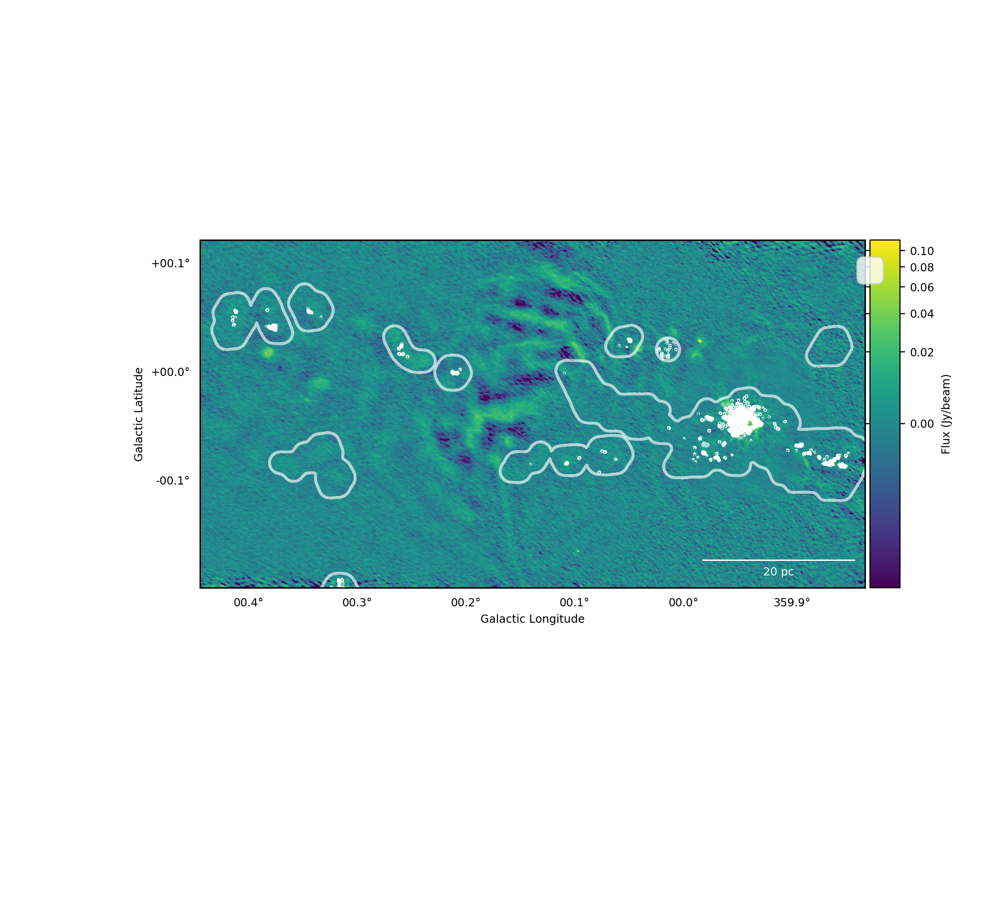

INFO: Auto-setting vmin to -1.468e-02 [aplpy.core]
INFO: Auto-setting vmax to  1.151e-01 [aplpy.core]


No handles with labels found to put in legend.
/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/normalize.py:92: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cbook.iterable(value):


In [25]:
%matplotlib nbagg



fig=aplpy.FITSFigure(pathcarma+'gc_carma15+8_continuum.fits')
fig.show_colorscale(cmap='viridis', pmin=0.25, pmax=99.95, stretch='arcsinh')
fig.show_colorbar()
fig.colorbar.set_width(0.3)
fig.colorbar.set_axis_label_text('Flux (Jy/beam)')

fig.set_tick_labels_format(xformat='ddd.d', yformat='dd.d')

#outline of SMA mask
fig.show_contour(path+'CMZoom_mosaic_Mask.fits',linewidths=2,colors='white', alpha=0.65, levels=[0], convention='wells')

#rms=1*1e7 #mjy/beam - is this good?
#fig.show_contour(path2+'CMZoom_continuum_no_pbcor.fits',linewidths=2,colors='white',
#                 levels=[5*rms, 10*rms, 15*rms, 20*rms, 25*rms], convention='wells')
pathmosaic='/Users/battersby/Dropbox/CMZoom_Data/continuum_images/Final_continuum_images/Mosaics/March_2020/'
rms=1.3*1e7 #Jy/Sr - is this good?
fig.show_contour(pathmosaic+'CMZoom_continuum.fits',linewidths=2,colors='white',
                 levels=[5*rms, 10*rms, 15*rms, 20*rms, 25*rms], convention='wells')
plt.gcf().subplots_adjust(bottom=0.2) # make room for x-axis
plt.gcf().subplots_adjust(left=0.2) # make room for y-axis

#path2='/Users/battersby/Dropbox/CMZoom_Data/continuum_images/Mosaics/'
#hdulist2=fits.open(path2+'Continuum_mosaic_current.fits')


#fig.add_label(-0.3,0.25, 'CMZoom Coverage', color='black',alpha=0.65, fontsize=10)
#fig.add_label(-0.5,0.25, 'CMZoom Coverage', color='black',alpha=0.65, fontsize=10)


#Add scalebar of 3 pc. First calculate the size in degrees of 1 pc
gcdist=8150 #pc Reid et al. (2019)
degper1pc=(1.0/gcdist)*(360.0/(2.0*np.pi))
fig.add_scalebar(20.0*degper1pc*u.degree)
#fig.scalebar.set_corner('bottom right')
fig.scalebar.set_label('20 pc')
fig.scalebar.set_color('white')

legend = plt.legend(loc='upper right', shadow=False, fontsize=24)#'x-large')

pathfig2 = '/Users/battersby/Dropbox/Work/cmz/cmzoom_overview/overleaf_cmzoom/not_used_other_versions_of_overleaf_things/other_figure_versions/'
plt.savefig(pathfig2+'CARMA_comparison_cmzoom_contours.pdf',
            format='pdf', dpi=300, bbox_inches='tight')
# need to save as PDF otherwise lose transparency

plt.show()





INFO: Setting slices=[0, 0] [aplpy.core]


<IPython.core.display.Javascript object>


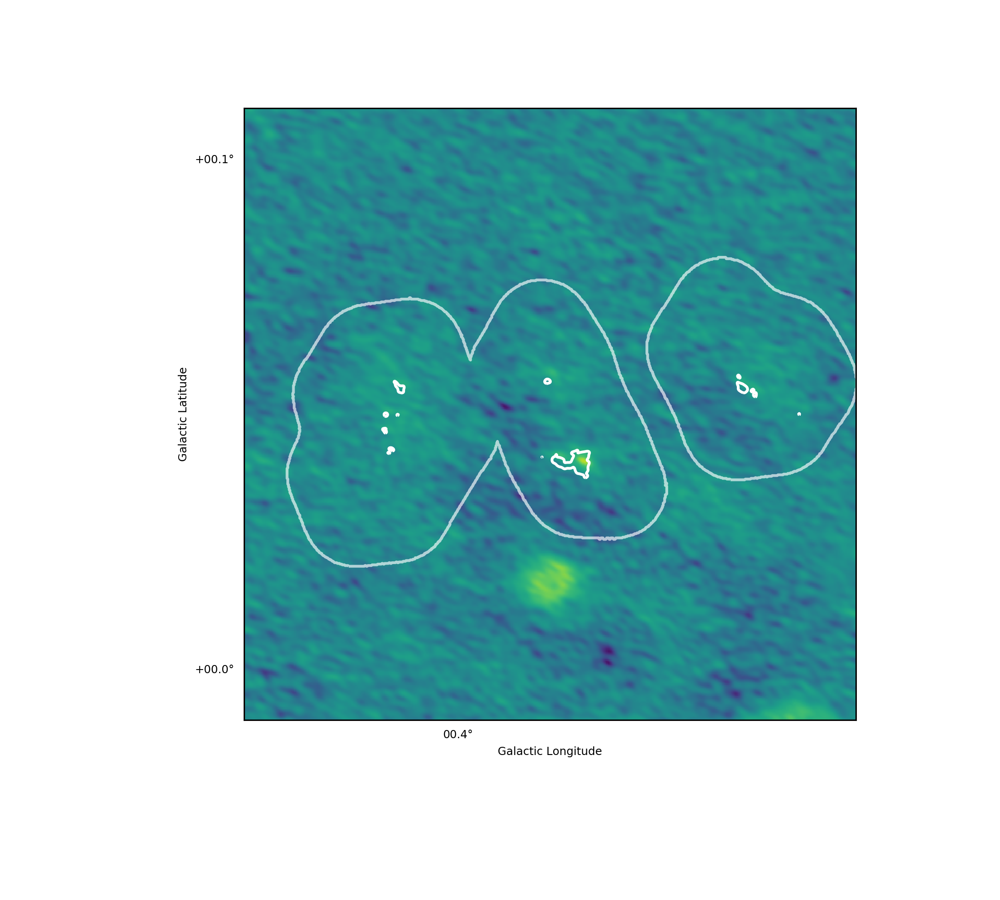

INFO: Auto-setting vmin to -1.468e-02 [aplpy.core]
INFO: Auto-setting vmax to  1.151e-01 [aplpy.core]


/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/normalize.py:92: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cbook.iterable(value):


In [27]:
#ZOOM IN - DUST RIDGE
%matplotlib nbagg

fig=aplpy.FITSFigure(pathcarma+'gc_carma15+8_continuum.fits')
fig.recenter(0.382,0.05,0.06,0.03)
fig.show_colorscale(cmap='viridis', pmin=0.25, pmax=99.95, stretch='arcsinh')


fig.set_tick_labels_format(xformat='ddd.d', yformat='dd.d')

#outline of SMA mask
fig.show_contour(path+'CMZoom_mosaic_Mask.fits',linewidths=2,colors='white', alpha=0.65, levels=[0], convention='wells')

#rms=1*1e7 #mjy/beam - is this good?
#fig.show_contour(path2+'CMZoom_continuum_no_pbcor.fits',linewidths='2',colors='white',
#                 levels=[5*rms, 10*rms, 15*rms, 20*rms, 25*rms], convention='wells')
pathmosaic='/Users/battersby/Dropbox/CMZoom_Data/continuum_images/Final_continuum_images/Mosaics/March_2020/'
rms=1.3*1e7 #Jy/Sr - is this good?
fig.show_contour(pathmosaic+'CMZoom_continuum.fits',linewidths=2,colors='white',
                 levels=[5*rms], convention='wells')
#                 levels=[5*rms, 10*rms, 15*rms, 20*rms, 25*rms], convention='wells')
plt.gcf().subplots_adjust(bottom=0.2) # make room for x-axis
plt.gcf().subplots_adjust(left=0.2) # make room for y-axis

#legend = plt.legend(loc='upper right', shadow=False, fontsize=24)#'x-large')
#plt.savefig(path3+'CARMA_comparison_cmzoom_contours_zoom_center.pdf',
plt.savefig(path3+'CARMA_comparison_cmzoom_contours_zoom_dustridge.pdf',
            format='pdf', dpi=300, bbox_inches='tight')
# need to save as PDF otherwise lose transparency

plt.show()





INFO: Setting slices=[0, 0] [aplpy.core]


<IPython.core.display.Javascript object>


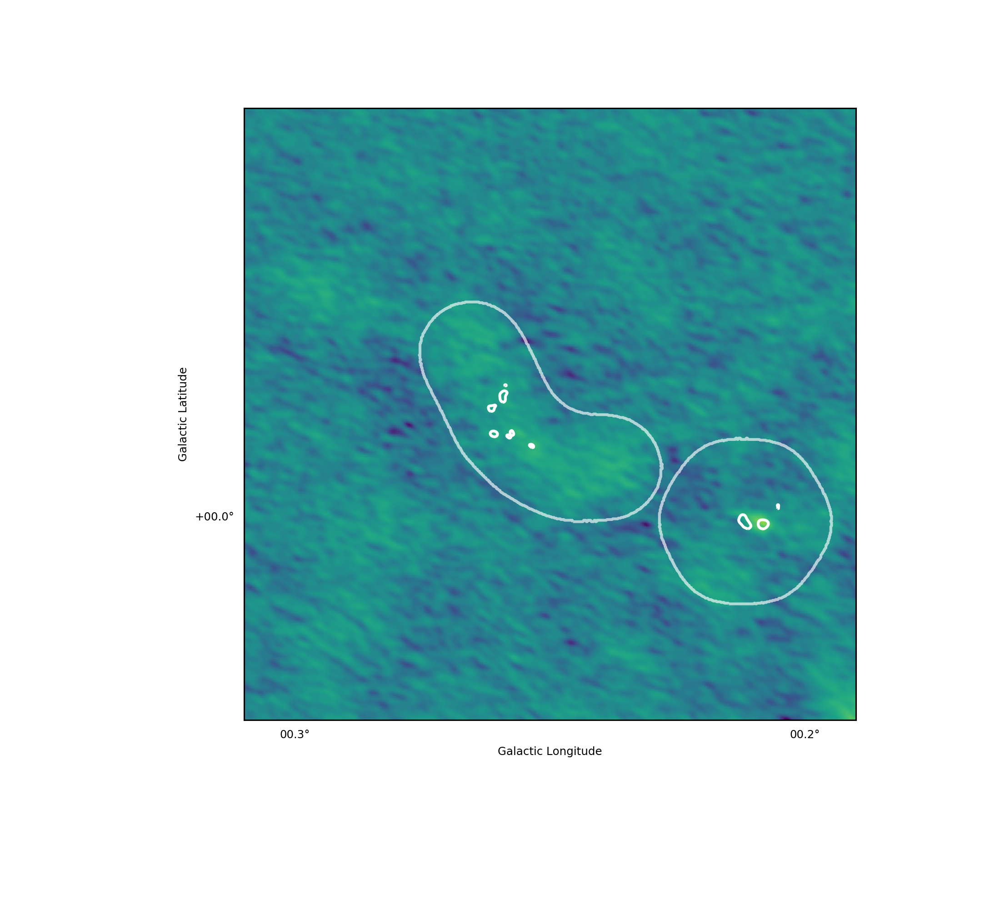

INFO: Auto-setting vmin to -1.468e-02 [aplpy.core]
INFO: Auto-setting vmax to  1.151e-01 [aplpy.core]


/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/core.py:910: UserWarning: No contour levels were found within the data range.
  c = self._ax1.contour(image_contour, levels, extent=extent_contour, cmap=cmap, colors=colors, **kwargs)
/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/normalize.py:92: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cbook.iterable(value):


In [28]:
#ZOOM IN - brick
%matplotlib nbagg

fig=aplpy.FITSFigure(pathcarma+'gc_carma15+8_continuum.fits')
fig.recenter(0.25,0.02,0.06,0.02)
fig.show_colorscale(cmap='viridis', pmin=0.25, pmax=99.95, stretch='arcsinh')

fig.set_tick_labels_format(xformat='ddd.d', yformat='dd.d')

#outline of SMA mask
fig.show_contour(path+'CMZoom_mosaic_Mask.fits',linewidths=2,colors='white', alpha=0.65, levels=[0], convention='wells')

#rms=1*1e7 #mjy/beam - is this good?
#fig.show_contour(path2+'CMZoom_continuum_no_pbcor.fits',linewidths='2',colors='white',
#                 levels=[5*rms, 10*rms, 15*rms, 20*rms, 25*rms], convention='wells')
#                 levels=[5*rms], convention='wells')
pathmosaic='/Users/battersby/Dropbox/CMZoom_Data/continuum_images/Final_continuum_images/Mosaics/March_2020/'
rms=1.3*1e7 #Jy/Sr - is this good?
fig.show_contour(pathmosaic+'CMZoom_continuum.fits',linewidths=2,colors='white',
                 levels=[5*rms], convention='wells')
#                 levels=[5*rms, 10*rms, 15*rms, 20*rms, 25*rms], convention='wells')
plt.gcf().subplots_adjust(bottom=0.2) # make room for x-axis
plt.gcf().subplots_adjust(left=0.2) # make room for y-axis

#legend = plt.legend(loc='upper right', shadow=False, fontsize=24)#'x-large')
#plt.savefig(path3+'CARMA_comparison_cmzoom_contours_zoom_center.pdf',
plt.savefig(path3+'CARMA_comparison_cmzoom_contours_zoom_brick.pdf',
            format='pdf', dpi=300, bbox_inches='tight')
# need to save as PDF otherwise lose transparency

plt.show()





INFO: Setting slices=[0, 0] [aplpy.core]


<IPython.core.display.Javascript object>


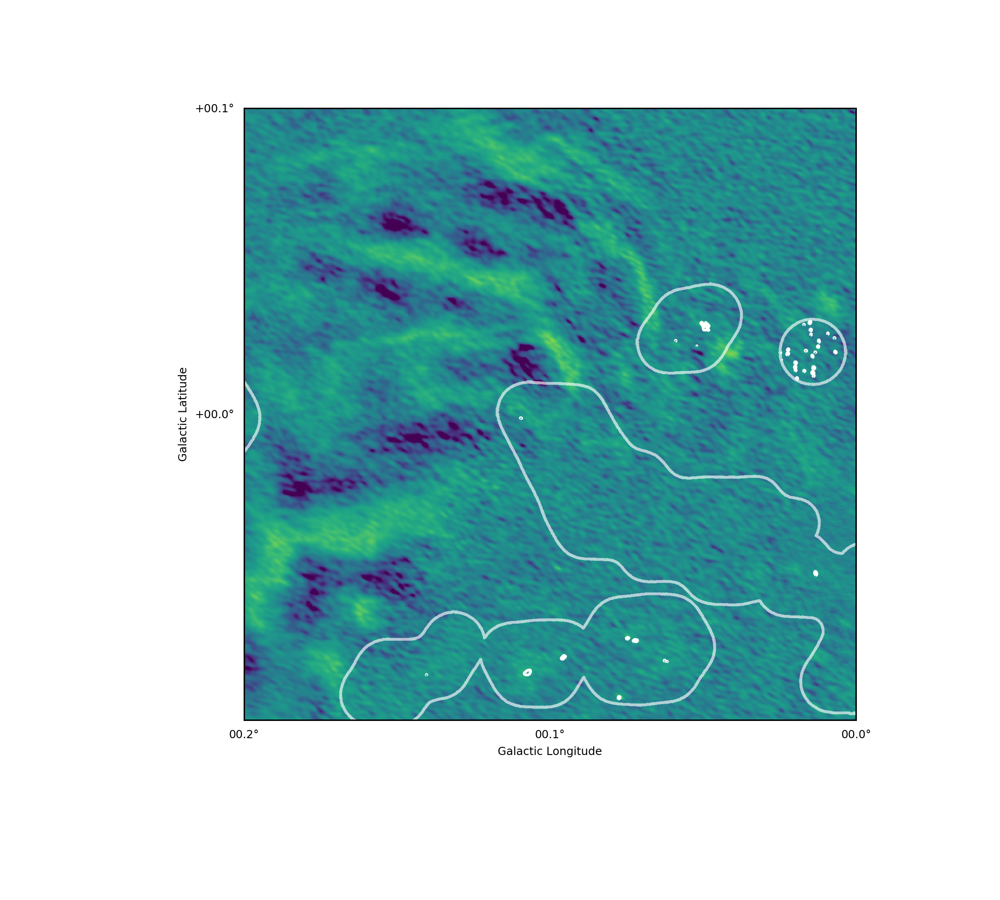

INFO: Auto-setting vmin to -1.468e-02 [aplpy.core]
INFO: Auto-setting vmax to  1.151e-01 [aplpy.core]


/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/core.py:910: UserWarning: No contour levels were found within the data range.
  c = self._ax1.contour(image_contour, levels, extent=extent_contour, cmap=cmap, colors=colors, **kwargs)
/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/normalize.py:92: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cbook.iterable(value):


In [29]:
#ZOOM IN - bridge
%matplotlib nbagg

fig=aplpy.FITSFigure(pathcarma+'gc_carma15+8_continuum.fits')
fig.recenter(0.1,0.0,0.1,0.05)
fig.show_colorscale(cmap='viridis', pmin=0.25, pmax=99.95, stretch='arcsinh')
fig.set_tick_labels_format(xformat='ddd.d', yformat='dd.d')

#outline of SMA mask
fig.show_contour(path+'CMZoom_mosaic_Mask.fits',linewidths=2,colors='white', alpha=0.65, levels=[0], convention='wells')

#rms=1*1e7 #mjy/beam - is this good?
#fig.show_contour(path2+'CMZoom_continuum_no_pbcor.fits',linewidths='2',colors='white',
#                 levels=[5*rms, 10*rms, 15*rms, 20*rms, 25*rms], convention='wells')
#                 levels=[5*rms], convention='wells')
pathmosaic='/Users/battersby/Dropbox/CMZoom_Data/continuum_images/Final_continuum_images/Mosaics/March_2020/'
rms=1.3*1e7 #Jy/Sr - is this good?
fig.show_contour(pathmosaic+'CMZoom_continuum.fits',linewidths=2,colors='white',
                 levels=[5*rms], convention='wells')
#                 levels=[5*rms, 10*rms, 15*rms, 20*rms, 25*rms], convention='wells')
plt.gcf().subplots_adjust(bottom=0.2) # make room for x-axis
plt.gcf().subplots_adjust(left=0.2) # make room for y-axis

#legend = plt.legend(loc='upper right', shadow=False, fontsize=24)#'x-large')
#plt.savefig(path3+'CARMA_comparison_cmzoom_contours_zoom_center.pdf',
plt.savefig(path3+'CARMA_comparison_cmzoom_contours_zoom_bridge.pdf',
            format='pdf', dpi=300, bbox_inches='tight')
# need to save as PDF otherwise lose transparency

plt.show()





INFO: Setting slices=[0, 0] [aplpy.core]


<IPython.core.display.Javascript object>


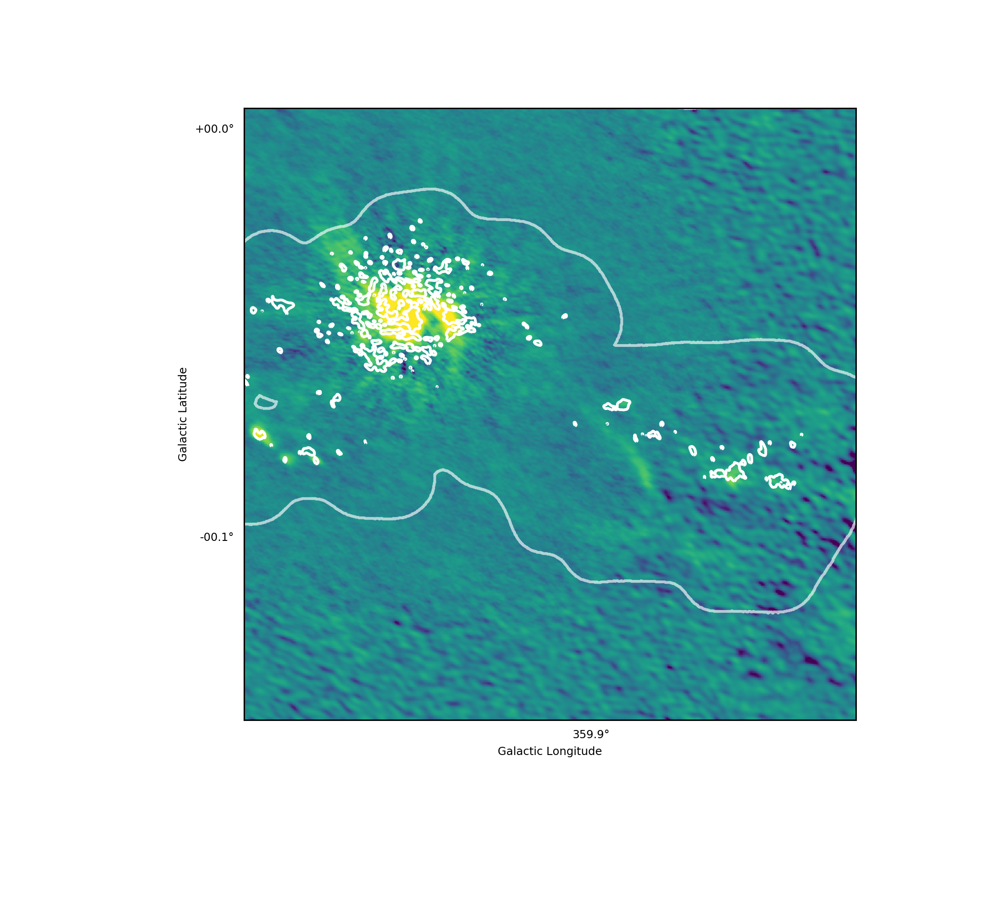

INFO: Auto-setting vmin to -1.468e-02 [aplpy.core]
INFO: Auto-setting vmax to  1.151e-01 [aplpy.core]


/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/core.py:910: UserWarning: No contour levels were found within the data range.
  c = self._ax1.contour(image_contour, levels, extent=extent_contour, cmap=cmap, colors=colors, **kwargs)
/Users/battersby/anaconda3/lib/python3.6/site-packages/aplpy/normalize.py:92: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cbook.iterable(value):


In [30]:
#ZOOM IN - SgrA*
%matplotlib nbagg

fig=aplpy.FITSFigure(pathcarma+'gc_carma15+8_continuum.fits')
fig.recenter(-0.09,-0.07, width=0.15,height=0.15)
fig.show_colorscale(cmap='viridis', pmin=0.25, pmax=99.95, stretch='arcsinh')
fig.set_tick_labels_format(xformat='ddd.d', yformat='dd.d')

#outline of SMA mask
fig.show_contour(path+'CMZoom_mosaic_Mask.fits',linewidths=2,colors='white', alpha=0.65, levels=[0], convention='wells')

#rms=1*1e7 #mjy/beam - is this good?
#fig.show_contour(path2+'CMZoom_continuum_no_pbcor.fits',linewidths='2',colors='white',
#                 levels=[5*rms, 10*rms, 15*rms, 20*rms, 25*rms], convention='wells')
#                 levels=[5*rms], convention='wells')
pathmosaic='/Users/battersby/Dropbox/CMZoom_Data/continuum_images/Final_continuum_images/Mosaics/March_2020/'
rms=1.3*1e7 #Jy/Sr - is this good?
fig.show_contour(pathmosaic+'CMZoom_continuum.fits',linewidths=2,colors='white',
                 levels=[5*rms], convention='wells')
#                 levels=[5*rms, 10*rms, 15*rms, 20*rms, 25*rms], convention='wells')
plt.gcf().subplots_adjust(bottom=0.2) # make room for x-axis
plt.gcf().subplots_adjust(left=0.2) # make room for y-axis

#legend = plt.legend(loc='upper right', shadow=False, fontsize=24)#'x-large')
#plt.savefig(path3+'CARMA_comparison_cmzoom_contours_zoom_center.pdf',
plt.savefig(path3+'CARMA_comparison_cmzoom_contours_zoom_sgra.pdf',
            format='pdf', dpi=300, bbox_inches='tight')
# need to save as PDF otherwise lose transparency

plt.show()



